In [1]:
import pandas as pd
import numpy as np

import soundfile as sf  
import base64
import io

import librosa
import scipy.signal as sg

import matplotlib.pyplot as plt
from IPython.display import Audio, IFrame, display

In [2]:
verbose = False
sample_rate = 48000
tail_cut_len = 24000

In [221]:
def snr(data):
    singleChannel = data
    try:
        singleChannel = np.sum(data, axis=1)
    except:
        # was mono after all
        pass
    norm = (singleChannel-np.min(singleChannel))/(np.max(singleChannel)-np.min(singleChannel))
    a = np.asanyarray(norm)
    m = a.mean(0)
    sd = a.std(axis=0, ddof=0)
    
    if verbose:
        print(f"data range: {min(singleChannel)} to {max(singleChannel)}")
        print(f"data range: {min(norm)} to {max(norm)}")
        print(f"mean:{m} sd:{sd}")
    
    return 20*np.log10(abs(np.where(sd == 0, 0, m/sd)))

# GRAB DATA

In [222]:
data_filepath = "./recordings_output.csv"
test_participant_demos = {
    '82A73E' : {'gender':'female', 'age': 27, 'accent' : 'canadian', 'condition' : 'normal'},
    '0FE229' : {'gender':'female', 'age': 27, 'accent' : 'canadian', 'condition' : 'talking'},
    '849492' : {'gender':'female', 'age': 27, 'accent' : 'canadian', 'condition' : 'traffic'},
    '30CFEC' : {'gender':'female', 'age': 27, 'accent' : 'canadian', 'condition' : 'normal'},
    'A0D4A2' : {'gender':'female', 'age': 27, 'accent' : 'canadian', 'condition' : 'talking'},
    '740E61' : {'gender':'female', 'age': 27, 'accent' : 'canadian', 'condition' : 'traffic'},
    '6E178B' : {'gender':'female', 'age': 26, 'accent' : 'canadian', 'condition' : 'normal'},
    'B3602E' : {'gender':'female', 'age': 26, 'accent' : 'canadian', 'condition' : 'talking'},
    'ED5A02' : {'gender':'female', 'age': 26, 'accent' : 'canadian', 'condition' : 'traffic'}
}

df = pd.read_csv(data_filepath)
print(df.head())
print(df.shape)

                                           file_name  \
0   Recording_82A73E_2023-07-20_09:10:48_vowels.flac   
1    Recording_82A73E_2023-07-20_09:10:48_capeV.flac   
2  Recording_82A73E_2023-07-20_09:10:48_rainbow.flac   
3   Recording_0FE229_2023-07-20_09:13:36_vowels.flac   
4    Recording_0FE229_2023-07-20_09:13:36_capeV.flac   

                                                data  \
0  \x5a6b786851344141414349534142494141426e364143...   
1  \x5a6b7868513441414143495341424941414271514143...   
2  \x5a6b7868513441414143495341424941414256584143...   
3  \x5a6b7868513441414143495341424941414234534143...   
4  \x5a6b7868513441414143495341424941414237424143...   

                                           meta_data study_code        prompt  \
0  {"OS":"iOS","recording_settings":{"AVSampleRat...     82A73E   vowels.flac   
1  {"OS":"iOS","recording_settings":{"AVSampleRat...     82A73E    capeV.flac   
2  {"OS":"iOS","recording_settings":{"AVSampleRat...     82A73E  rainbow.flac   
3 

In [223]:
study_codes = df["study_code"].tolist()
prompts = df["prompt"].tolist()
audios = df['data'].tolist()

ages = [test_participant_demos[code]['age'] for code in study_codes]

In [224]:
decoded_audios = [base64.b64decode(bytearray.fromhex(a[2:]).decode()) for a in audios]
audio_data = [sf.read(io.BytesIO(a))[0] for a in decoded_audios]

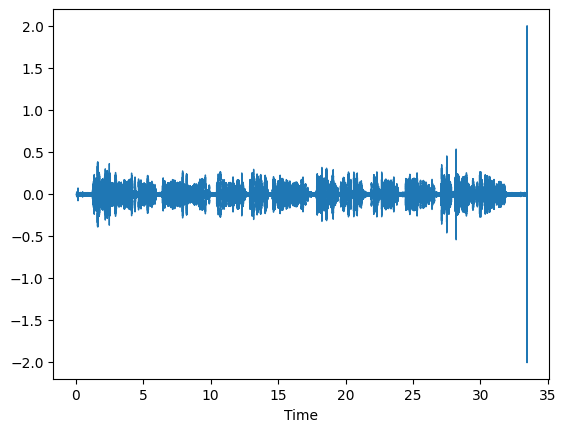

In [225]:
display(Audio(decoded_audios[2]))
librosa.display.waveshow(audio_data[2],sr=sample_rate, axis='time');

# CALCULATE SNR

In [226]:
# Using algorithm
snrs = [[snr(audio_data[i]), ages[i], test_participant_demos[study_codes[i]]['condition'], prompts[i]] for i in range(len(audio_data))]

snr range: 4.470160795369187 to 30.54401019291714
average snr: 19.49256855844642


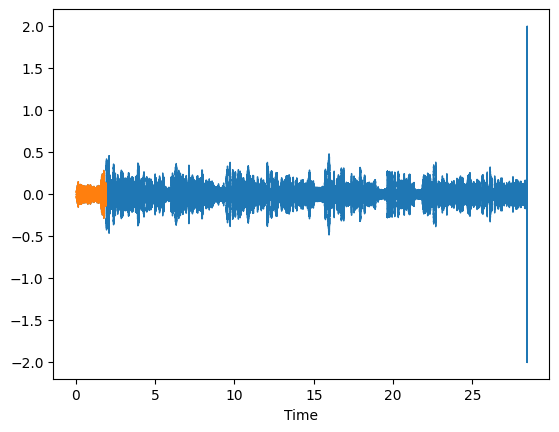

In [326]:
display(Audio(decoded_audios[9]))
librosa.display.waveshow(audio_data[26],sr=sample_rate, axis='time');
librosa.display.waveshow(audio_data[26][0:90000],sr=sample_rate, axis='time');

In [327]:
# Using manually labelled windows
snr_windows = [{"noise": [(0, 45000), (105000, 155000), (250000, 28000), (530000,560000)], "signal": [(45000,105000), (155000, 250000), (280000,530000), (560000, 690000)]},
               {"noise": [(10000, 50000), (170000, 195000), (275000, 310000)], "signal": [(50000, 170000), (195000, 275000)]},
               {"noise": [(10000, 50000), (285000, 290000)], "signal": [(50000, 150000), (310000, 340000)]}, # 2
               {"noise": [(0, 10000)], "signal": [(50000, 70000)]}, # 3
               {"noise": [(0, 40000)], "signal": [(50000, 90000)]}, # 4
               {"noise": [(0, 50000)], "signal": [(60000, 100000)]}, # 5
               {"noise": [(0, 40000)], "signal": [(50000, 100000)]}, # 6
               {"noise": [(0, 40000)], "signal": [(50000, 100000)]}, # 7
               {"noise": [(0, 40000)], "signal": [(50000, 100000)]}, # 8
               {"noise": [(0, 40000)], "signal": [(90000, 130000)]}, # 9
               {"noise": [(0, 40000)], "signal": [(95000, 180000)]}, # 10
               {"noise": [(0, 40000)], "signal": [(75000, 130000)]}, # 11
               {"noise": [(0, 80000)], "signal": [(95000, 130000)]}, # 12
               {"noise": [(0, 70000)], "signal": [(90000, 130000)]}, # 13
               {"noise": [(0, 70000)], "signal": [(90000, 130000)]}, # 14
               {"noise": [(0, 100000)], "signal": [(100000, 160000)]}, # 15
               {"noise": [(0, 70000)], "signal": [(90000, 130000)]}, # 16
               {"noise": [(0, 70000)], "signal": [(90000, 130000)]}, # 17
               {"noise": [(0, 20000)], "signal": [(20000, 40000)]}, # 18
               {"noise": [(0, 50000)], "signal": [(60000, 130000)]}, # 19
               {"noise": [(0, 70000)], "signal": [(90000, 130000)]}, # 20
               {"noise": [(0, 50000)], "signal": [(60000, 100000)]}, # 21
               {"noise": [(0, 50000)], "signal": [(60000, 100000)]}, # 22
               {"noise": [(0, 50000)], "signal": [(70000, 130000)]}, # 23
               {"noise": [(0, 50000)], "signal": [(60000, 90000)]}, # 24
               {"noise": [(0, 50000)], "signal": [(60000, 130000)]}, # 25
               {"noise": [(0, 50000)], "signal": [(80000, 130000)]} # 26
]

def manual_snr(data, windows, scalar=1):
    noise_data = [data[int(window[0]*scalar):int(window[1]*scalar)]for window in windows["noise"]]
    signal_data = [data[int(window[0]*scalar):int(window[1]*scalar)]for window in windows["signal"]]
    noise_data = np.array([item for sublist in noise_data for item in sublist])
    signal_data = np.array([item for sublist in signal_data for item in sublist])

    noise_data = (noise_data-np.min(noise_data))
    signal_data = (signal_data-np.min(signal_data))
    
    signal = signal_data.mean(0)
    noise = noise_data.mean(0)

    if verbose:
        print(f"data range: {min(data)} to {max(data)}")
        # print(f"data range: {min(norm)} to {max(norm)}")
        print(f"signal:{signal} noise:{noise}")
    
    return 20*np.log10(abs(np.where(noise == 0, 0, signal/noise)))


manual_snrs = [[manual_snr(audio_data[i], snr_windows[i]), ages[i], test_participant_demos[study_codes[i]]['condition'], prompts[i]] for i in range(len(snr_windows))]
manual_snrs
snrs = manual_snrs

In [328]:
if verbose:
    print(snrs)
lo_snrs = [s[0] for s in snrs]
print(f"snr range: {min(lo_snrs)} to {max(lo_snrs)}")
print(f"average snr: {sum(lo_snrs)/len(lo_snrs)}")

snr range: 0.8496230698944265 to 26.953574509600244
average snr: 10.930176834297272


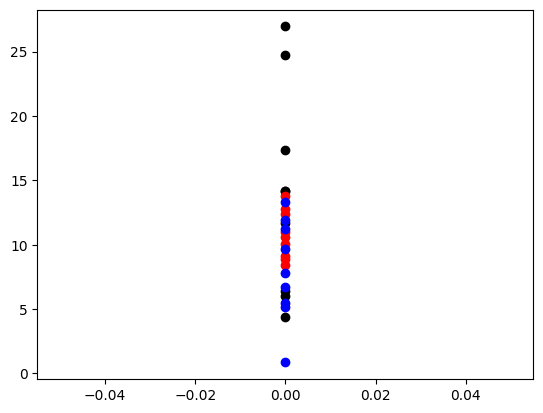

[4.358377255257734,
 14.209922792184372,
 24.745467366209375,
 5.9818196520124705,
 26.953574509600244,
 11.683126362118333,
 14.193081693918348,
 17.32241029137733,
 6.379817680552383]

In [329]:
normal_ages = [snr[1] for snr in snrs if snr[2] == 'normal']
normal_snrs = [snr[0] for snr in snrs if snr[2] == 'normal']

talking_ages = [snr[1] for snr in snrs if snr[2] == 'talking']
talking_snrs = [snr[0] for snr in snrs if snr[2] == 'talking']

traffic_ages = [snr[1] for snr in snrs if snr[2] == 'traffic']
traffic_snrs = [snr[0] for snr in snrs if snr[2] == 'traffic']

plt.plot([0 for age in normal_ages], normal_snrs, 'o', color='black')
plt.plot([0 for age in talking_ages], talking_snrs, 'o', color='red')
plt.plot([0 for age in traffic_ages], traffic_snrs, 'o', color='blue')

plt.show()
normal_snrs

In [330]:
print("ENVIRONMENT SNRS")
print(f"Average SNR in normal conditions: {sum(normal_snrs) / len(normal_snrs)}")
print(f"Average SNR with background talking: {sum(talking_snrs) / len(talking_snrs)}")
print(f"Average SNR with background traffic noises: {sum(traffic_snrs) / len(traffic_snrs)}")

ENVIRONMENT SNRS
Average SNR in normal conditions: 13.98084417813673
Average SNR with background talking: 10.784986742405254
Average SNR with background traffic noises: 8.024699582349829


In [331]:
vowel_snrs = [snr[0] for snr in snrs if snr[3] == 'vowels.flac']
capeV_snrs = [snr[0] for snr in snrs if snr[3] == 'capeV.flac']
rainbow_snrs = [snr[0] for snr in snrs if snr[3] == 'rainbow.flac']
print("PROMPT SNRS")
print(f"Average SNR for Vowels: {sum(vowel_snrs) / len(vowel_snrs)}")
print(f"Average SNR for Cape-V Sentences: {sum(capeV_snrs) / len(capeV_snrs)}")
print(f"Average SNR for Rainbow Passage: {sum(rainbow_snrs) / len(rainbow_snrs)}")

PROMPT SNRS
Average SNR for Vowels: 8.359550203379372
Average SNR for Cape-V Sentences: 13.630978041204294
Average SNR for Rainbow Passage: 10.800002258308147


# REMOVING NOISE

## Single Audio Example

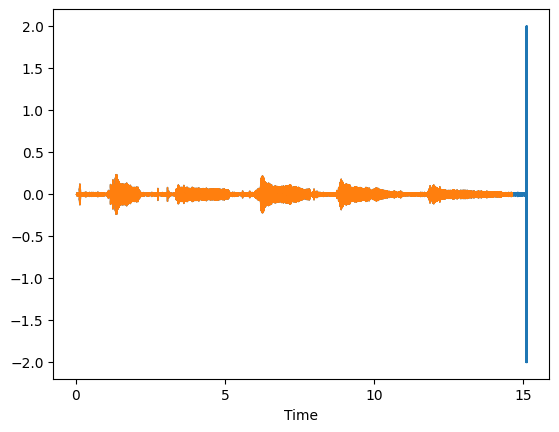

In [332]:
# Chop off last 0.5s
noisy_audio = audio_data[0]
librosa.display.waveshow(noisy_audio,sr=sample_rate, axis='time');
librosa.display.waveshow(noisy_audio[:-tail_cut_len],sr=sample_rate, axis='time');

In [333]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    return sg.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = sg.lfilter(b, a, data)
    return y

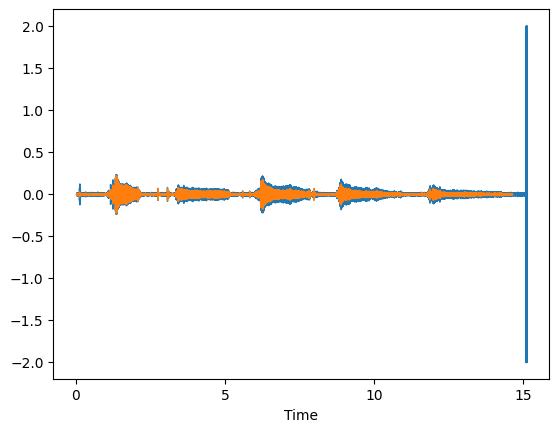

In [334]:
librosa.display.waveshow(noisy_audio,sr=sample_rate, axis='time');
librosa.display.waveshow(butter_bandpass_filter(noisy_audio[:-tail_cut_len], 200, 8000, sample_rate),sr=sample_rate, axis='time');

In [335]:
import torch
import torchaudio
from denoiser import pretrained
from denoiser.dsp import convert_audio
model = pretrained.dns64()
model.sample_rate

16000

In [336]:
noisy_audio = audio_data[17]

sf.write('noisy.wav', butter_bandpass_filter(noisy_audio[:-tail_cut_len], 200, 8000, sample_rate), sample_rate)


wav, samplerate = torchaudio.load('noisy.wav')
wav = convert_audio(wav, sample_rate, model.sample_rate, model.chin)
with torch.no_grad():
    denoised = model(wav[None])[0]
reduced_noise = denoised.data.cpu().numpy()[0]

snr: 18.87324366716112 -> 23.76407876951938


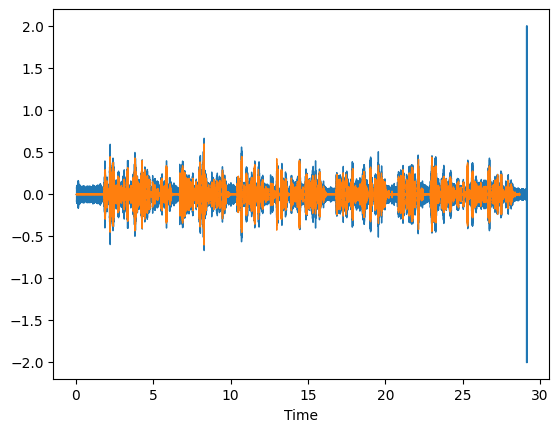

In [337]:
print(f"snr: {manual_snr(noisy_audio)} -> {manual_snr(reduced_noise)}")

display(Audio(noisy_audio, rate=sample_rate))
display(Audio(reduced_noise, rate=model.sample_rate))

librosa.display.waveshow(noisy_audio,sr=sample_rate, axis='time');
librosa.display.waveshow(reduced_noise,sr=model.sample_rate, axis='time');

## Apply to all audios

In [338]:
snr_clean = []
manual_snr_cleaned = []
clean_audios = []
for ad in audio_data:
    sf.write('noisy.wav', butter_bandpass_filter(ad[:-tail_cut_len], 200, 8000, sample_rate), sample_rate)
    
    wav, sr = torchaudio.load('noisy.wav')
    wav = convert_audio(wav, sample_rate, model.sample_rate, model.chin)
    with torch.no_grad():
        denoised = model(wav[None])[0]
    ad_clean = denoised.data.cpu().numpy()[0]
    snr_clean.append(snr(ad_clean))
    
    i = len(manual_snr_cleaned)
    if i < len(snr_windows):
        manual_snr_cleaned.append(manual_snr(ad_clean, snr_windows[i], scalar = model.sample_rate / sample_rate))
        clean_audios.append(ad_clean)
    else:
        break
        
snr_clean = [[manual_snr_cleaned[i], test_participant_demos[study_codes[i]]['condition'], prompts[i]] for i in range(len(snr_clean))]

In [339]:
manual_snr_cleaned

[22.082726595121596,
 24.241498071130373,
 37.60620110922476,
 31.014637702172685,
 43.3490537974295,
 41.79234146115878,
 44.268741858895964,
 47.738437366712326,
 44.82878292968488,
 49.828666004190836,
 55.146811093949104,
 43.705521173431194,
 38.507433786592145,
 47.85542849365514,
 45.544250875431835,
 47.31802898711856,
 48.21383362450648,
 48.828593892434284,
 37.393472207857876,
 25.403114814399714,
 15.870141603393712,
 21.967955953325884,
 51.25502395252347,
 48.389795148984554,
 25.701138056931217,
 56.25566495637873,
 34.21488319946217]

In [340]:
lo_snr_deltas = [s[0] for s in snr_clean]

print(f"Average SNR - Cleaned: {sum(lo_snr_deltas) / len(lo_snr_deltas)}")
print(f"SNR range - Cleaned: {min(lo_snr_deltas)} to {max(lo_snr_deltas)}")

Average SNR - Cleaned: 39.937858470966574
SNR range - Cleaned: 15.870141603393712 to 56.25566495637873


In [341]:
manual_snr(audio_data[i], snr_windows[i])

9.677642683103935

In [342]:
normal_snr_deltas = [snr[0] for snr in snr_clean if snr[1] == 'normal']
talking_snr_deltas = [snr[0] for snr in snr_clean if snr[1] == 'talking']
traffic_snr_deltas = [snr[0] for snr in snr_clean if snr[1] == 'traffic']
print("ENVIRONMENT SNR - Cleaned")
print(f"Average Clean SNR in normal conditions: {sum(normal_snr_deltas) / len(normal_snr_deltas)}")
print(f"Average Clean SNR with background talking: {sum(talking_snr_deltas) / len(talking_snr_deltas)}")
print(f"Average Clean SNR with background traffic noises: {sum(traffic_snr_deltas) / len(traffic_snr_deltas)}")

ENVIRONMENT SNR - Cleaned
Average Clean SNR in normal conditions: 34.58646140807769
Average Clean SNR with background talking: 41.07510235236377
Average Clean SNR with background traffic noises: 44.15201165245829


In [343]:
vowel_snr_deltas = [snr[0] for snr in snr_clean if snr[2] == 'vowels.flac']
capeV_snr_deltas = [snr[0] for snr in snr_clean if snr[2] == 'capeV.flac']
rainbow_snr_deltas = [snr[0] for snr in snr_clean if snr[2] == 'rainbow.flac']
print("PROMPT SNR - Cleaned")
print(f"Average Clean SNR improvement for Vowels: {sum(vowel_snr_deltas) / len(vowel_snr_deltas)}")
print(f"Average Clean SNR improvement for Cape-V Sentences: {sum(capeV_snr_deltas) / len(capeV_snr_deltas)}")
print(f"Average Clean SNR improvement for Rainbow Passage: {sum(rainbow_snr_deltas) / len(rainbow_snr_deltas)}")

PROMPT SNR - Cleaned
Average Clean SNR improvement for Vowels: 35.342533461356304
Average Clean SNR improvement for Cape-V Sentences: 44.38431846340942
Average Clean SNR improvement for Rainbow Passage: 40.08672348813403


# TESTING

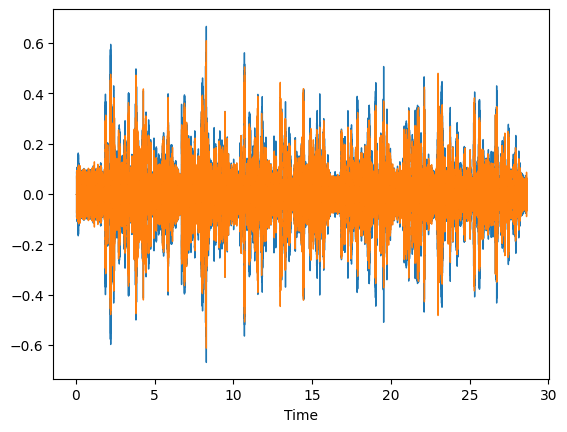

In [224]:
noisy_audio = audio_data[17]
[:-24000]

# sf.write('noisy.wav', butter_bandpass_filter(noisy_audio, 200, 8000, sample_rate), sample_rate)
librosa.display.waveshow(noisy_audio,sr=sample_rate, axis='time');
librosa.display.waveshow(butter_bandpass_filter(noisy_audio, 200, 8000, sample_rate),sr=sample_rate, axis='time');

In [129]:
test_noise = audio_data[6]
sf.write('noisy.wav', test_noise, sample_rate)


wav, sr = torchaudio.load('noisy.wav')
wav = convert_audio(wav, sample_rate, model.sample_rate, model.chin)
with torch.no_grad():
    denoised = model(wav[None])[0]
test_clean = denoised.data.cpu().numpy()[0]

snr: 26.28260395013839 -> 17.472872079615446


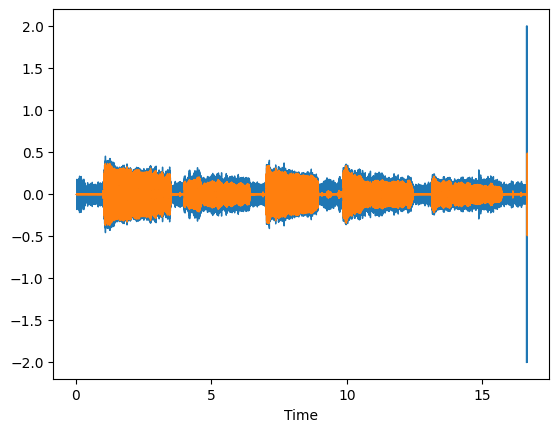

In [130]:
print(f"snr: {snr(test_noise)} -> {snr(test_clean)}")

display(Audio(test_noise, rate=sample_rate))
display(Audio(test_clean, rate=samplerate))

librosa.display.waveshow(test_noise,sr=sample_rate, axis='time');
librosa.display.waveshow(test_clean,sr=samplerate, axis='time');

In [96]:
from scipy.io import wavfile

test_audio, samplerate = sf.read('download.flac')
print(test_audio)
# print(f"data range: {min(test_audio)} to {max(test_audio)}")

length = data.shape[0] / samplerate
print(f"length = {length}s")
print(f"snr = {snr(test_audio)}")

time = np.linspace(0., length, test_audio.shape[0])
plt.plot(time, test_audio)
plt.show()

[ 0.          0.          0.         ... -1.9990263  -1.99927461
 -1.99945962]


NameError: name 'data' is not defined

In [35]:
import speech_recognition as sr_audio 

r = sr_audio.Recognizer()
sf.write('tmp.flac', audio_data[2], samplerate)
recog_audio = sr_audio.AudioFile('tmp.flac')
with recog_audio as source:
    audio = r.record(source)
    text=r.recognize_sphinx(audio) 
    print('transcript: ' + text) 

transcript: when the sunlight straight slingshots danny a payback that the sun and fun having the main balance the division of white lady and in many beautiful colors he's taking shape along that line with its have high above and it's you and in the p. l. o. the rising days according to legend of boiling pot of gold at the end people look i know i haven't finds a man looks less on the n. b. i. has reached his fans they say he is looking for the pie hole at the end of the vein
